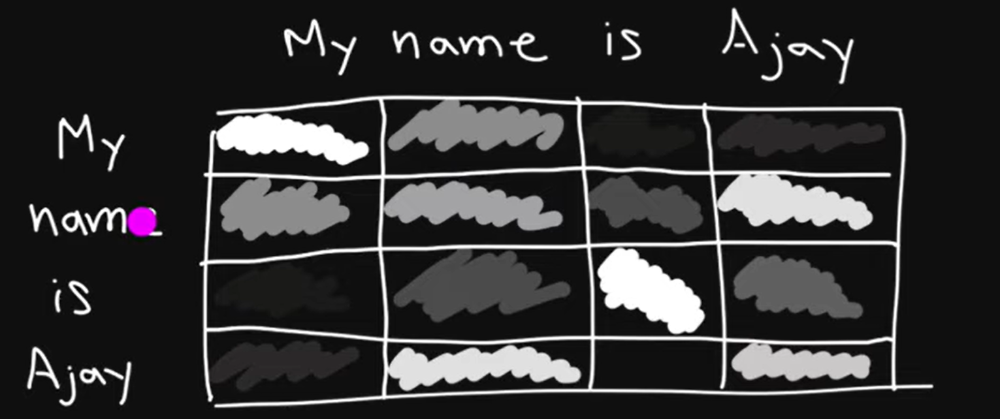

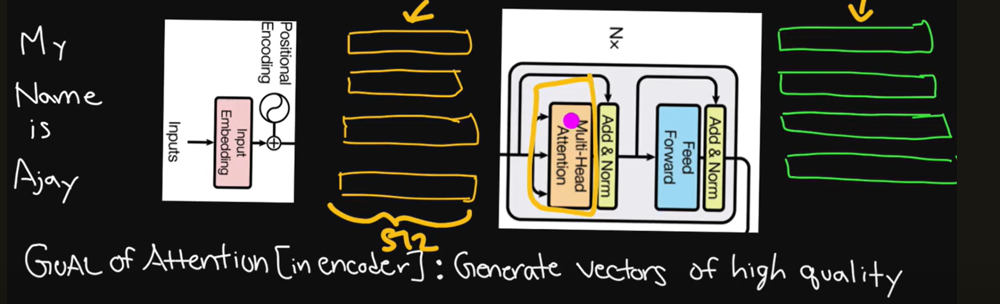

# Goal of the green ones:
- more context aware, higher quality vectors! 
- this whole block is sequence to sequence.. can be parallelised by modern GPUs!
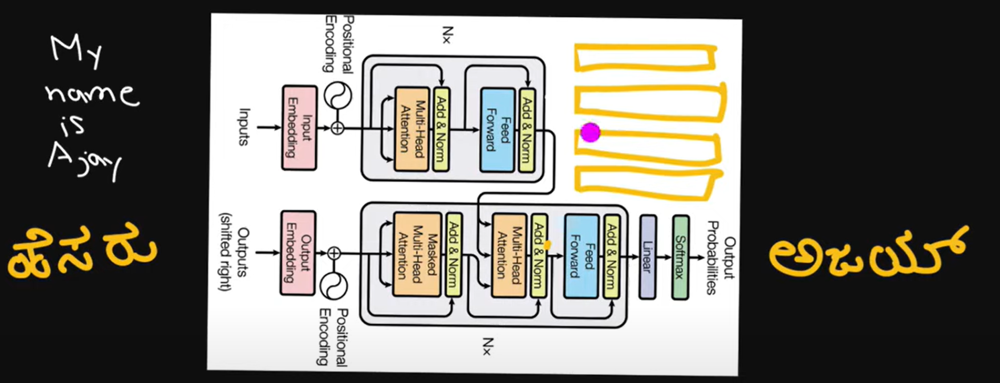

# Multi-head attention deep-dive

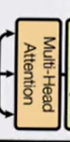
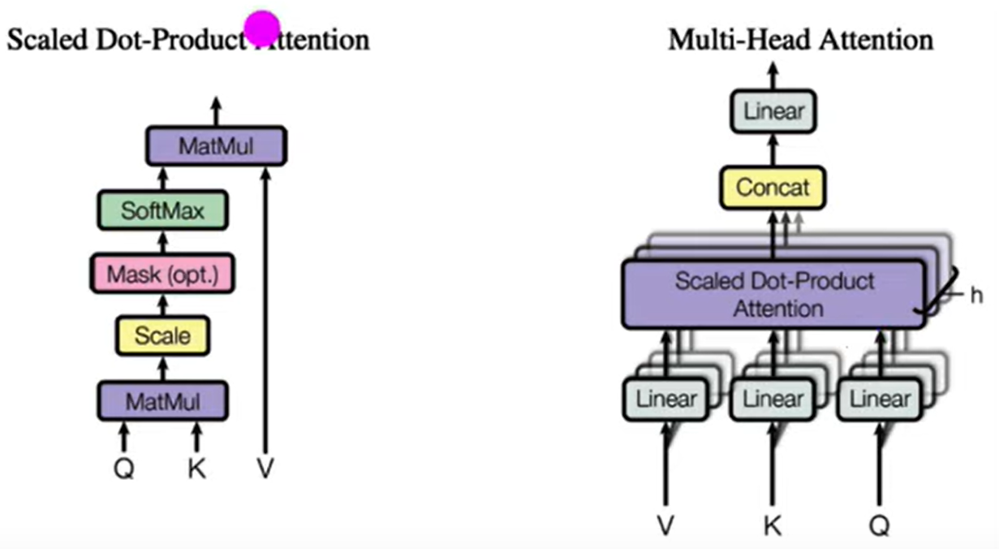

- Every single word that is input into the transformer:
    - Query: What am i looking for
    - Key: What can i offer?
    - Value: What i actually offer.

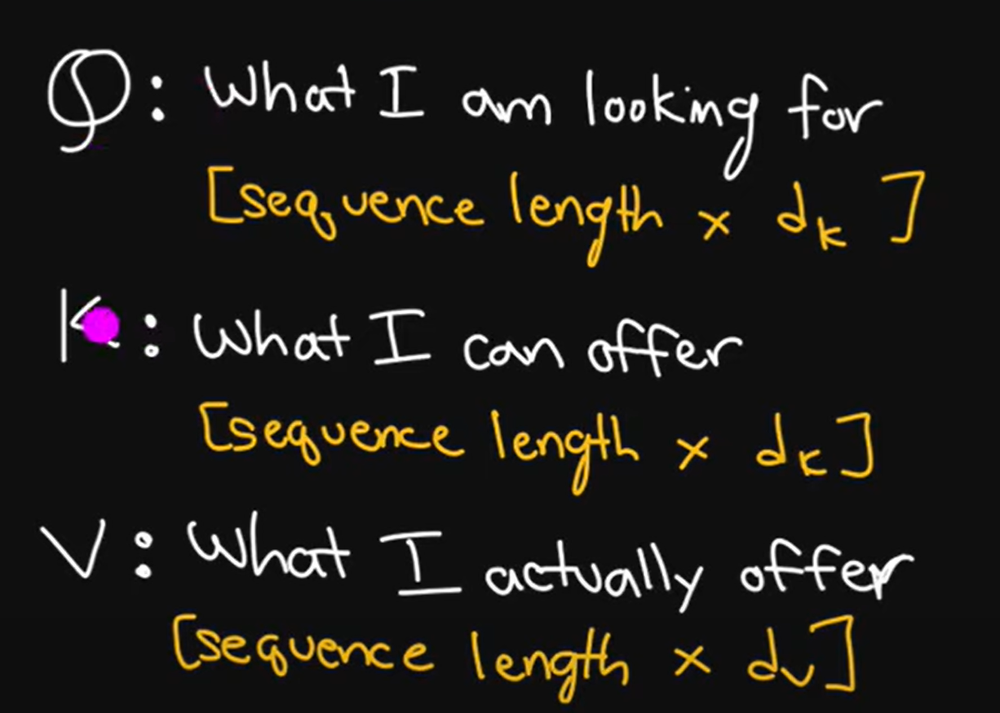

In [1]:
%pip install numpy

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import math

L, d_k, d_v = 4, 8, 8
q = np.random.randn(L, d_k)
k = np.random.randn(L, d_k)
v = np.random.randn(L, d_k)

In [ ]:
# my name is Richard...

In [4]:
q.shape

(4, 8)

In [3]:
print("Q\n", q)
print("K\n", k)
print("V\n", v)

Q
 [[ 1.35002795 -0.92687879 -1.40865786  1.35258494 -0.40023215 -1.2309104
  -0.38679672  1.10474751]
 [ 1.76262816  0.11914723 -0.97918377 -0.20462441  0.69660061 -1.51862357
   1.14864483 -2.05943354]
 [-0.96051158  0.09505301 -0.79444342  0.49959606 -0.71161532  1.46415452
   0.12258953 -0.1191897 ]
 [-0.19030283  1.02286023  1.57406078 -0.28226746  2.01282832  0.88498014
   0.23688107 -0.34803264]]
K
 [[-6.28026004e-01  7.95073401e-01 -9.30179033e-01 -5.47061165e-01
  -3.66063867e-01 -1.64355324e+00 -2.35366503e-01  1.77684345e+00]
 [-9.12417404e-01  4.43149000e-02  1.06259596e+00 -2.02706345e-01
  -2.21996255e-01 -2.68710840e+00  2.39502499e-01 -3.00192873e-01]
 [ 4.67616201e-01  1.35813411e+00 -6.67919766e-02 -1.13111938e-01
  -1.30530288e+00  3.83659096e-01 -2.93443684e-01 -5.11461103e-01]
 [-9.76244507e-01 -4.24368115e-01  8.84937027e-01 -4.13614005e-03
  -1.35660990e+00 -1.26542868e+00  1.52614562e-03  8.12530253e-01]]
V
 [[ 0.61144238 -1.76207105 -1.10972443 -0.20548802  0.8

# Self Attention

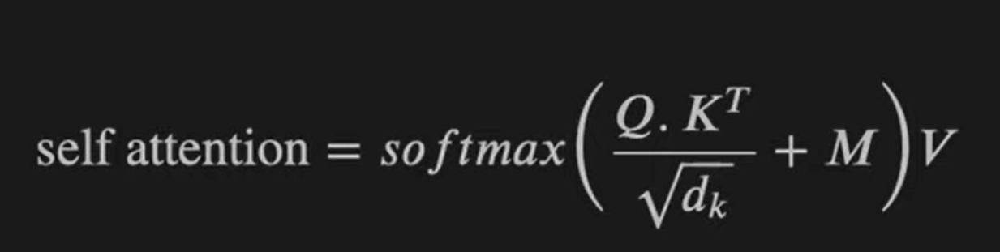

In [5]:
np.matmul(q, k.T)

array([[ 3.20914765, -0.07171165, -1.08779534,  0.82085114],
       [-1.67819238,  2.21742333,  0.29894754, -3.33189248],
       [-1.24208878, -3.7760695 ,  1.19209362, -0.791799  ],
       [-3.24246576, -0.71489577, -0.95234014, -2.98710262]])

In [6]:

# why we need sqrt(d_k) in the denom
## minimise the variance and stabilise the values of the Q.Kt vector.. 

q.var(), k.var(), np.matmul(q, k.T).var()

(1.0903340102723915, 0.8235629048245199, 3.786308009927331)

In [7]:
scaled = np.matmul(q, k.T) / math.sqrt(d_k) # to make it more stable .. we divide by the sqrt of the dimension of the query vector
q.var(), k.var(), scaled.var()  # we can see variance is much LOWER now. 

(1.0903340102723915, 0.8235629048245199, 0.47328850124091626)

In [8]:
scaled # - lower values!! 

array([[ 1.13460503, -0.0253539 , -0.38459373,  0.2902147 ],
       [-0.59333061,  0.78397754,  0.10569392, -1.17800188],
       [-0.4391447 , -1.33504218,  0.42146874, -0.27994322],
       [-1.14638476, -0.25275382, -0.33670309, -1.05610026]])

## Masking

- This is to ensure words don't get context from words generated in the future. 
- Not required in the encoders, but required int he decoders

In [9]:
mask = np.tril(np.ones((L,L)))

In [10]:
mask # this makes sense, My Name Is Richard, My can only see itselves, Name can see My Name .. etc

array([[1., 0., 0., 0.],
       [1., 1., 0., 0.],
       [1., 1., 1., 0.],
       [1., 1., 1., 1.]])

In [11]:
mask[mask==0] = -np.infty
mask[mask==1] = 0
mask

array([[  0., -inf, -inf, -inf],
       [  0.,   0., -inf, -inf],
       [  0.,   0.,   0., -inf],
       [  0.,   0.,   0.,   0.]])

In [12]:
scaled + mask

array([[ 1.13460503,        -inf,        -inf,        -inf],
       [-0.59333061,  0.78397754,        -inf,        -inf],
       [-0.4391447 , -1.33504218,  0.42146874,        -inf],
       [-1.14638476, -0.25275382, -0.33670309, -1.05610026]])

## Softmax

$$
\text{softmax} = \frac{e^{x_i}}{\sum_j e^x_j}
$$

Converts a vector into a probability distribution

In [13]:
def softmax(x):
    return (np.exp(x).T/np.sum(np.exp(x), axis = -1)).T

In [14]:
attention = softmax(scaled)
attention

array([[0.5096306 , 0.15976871, 0.11155161, 0.21904908],
       [0.13274405, 0.5262261 , 0.26705305, 0.0739768 ],
       [0.20220705, 0.08254922, 0.47814097, 0.23710276],
       [0.14736948, 0.36016916, 0.33116759, 0.16129377]])

In [15]:
attention = softmax(scaled + mask)
attention

array([[1.        , 0.        , 0.        , 0.        ],
       [0.20144167, 0.79855833, 0.        , 0.        ],
       [0.26505149, 0.1082049 , 0.62674361, 0.        ],
       [0.14736948, 0.36016916, 0.33116759, 0.16129377]])

In [16]:
new_v = np.matmul(attention, v)
new_v # new v with masking and softmax

array([[ 6.11442380e-01, -1.76207105e+00, -1.10972443e+00,
        -2.05488019e-01,  8.55971246e-01,  4.31599731e-01,
         3.22944149e-01, -7.91599320e-03],
       [ 2.54467103e-01, -2.11890324e+00, -1.50177974e+00,
        -6.65369638e-01,  1.80695791e-01, -1.89469671e+00,
        -1.39746429e+00, -4.78092452e-01],
       [ 1.42615716e+00, -1.13168839e+00,  1.94953954e-01,
         5.96462283e-02,  5.14079090e-01, -8.16217257e-01,
        -5.16862922e-02,  2.03327328e-03],
       [ 1.02621559e+00, -1.40800796e+00, -2.51425185e-01,
        -3.59773847e-01,  5.40956981e-01, -1.03623450e+00,
        -6.65675417e-01, -2.94525939e-02]])

In [17]:
v #old v

array([[ 0.61144238, -1.76207105, -1.10972443, -0.20548802,  0.85597125,
         0.43159973,  0.32294415, -0.00791599],
       [ 0.16441771, -2.20891655, -1.60067831, -0.78137785,  0.01035305,
        -2.48152052, -1.83144881, -0.5966976 ],
       [ 1.98853665, -0.6791186 ,  1.05671488,  0.31697179,  0.4564584 ,
        -1.05641401,  0.09715075,  0.10960945],
       [ 1.35374462, -0.79263305,  0.85979496, -0.94878903,  1.61146872,
         0.8914053 , -0.53200641,  0.93200722]])

## first vector, my are the same.. but later ones are very differnet, due to masking...

# Actual function with mask and softmax together..

In [18]:
def softmax(x):
  return (np.exp(x).T / np.sum(np.exp(x), axis=-1)).T

def scaled_dot_product_attention(q, k, v, mask=None):
  d_k = q.shape[-1]
  scaled = np.matmul(q, k.T) / math.sqrt(d_k)
  if mask is not None:
    scaled = scaled + mask
  attention = softmax(scaled)
  out = np.matmul(attention, v)
  return out, attention

In [19]:
values, attention = scaled_dot_product_attention(q, k, v, mask=mask)
print("Q\n", q)
print("K\n", k)
print("V\n", v)
print("New V\n", values)
print("Attention\n", attention)

Q
 [[ 1.35002795 -0.92687879 -1.40865786  1.35258494 -0.40023215 -1.2309104
  -0.38679672  1.10474751]
 [ 1.76262816  0.11914723 -0.97918377 -0.20462441  0.69660061 -1.51862357
   1.14864483 -2.05943354]
 [-0.96051158  0.09505301 -0.79444342  0.49959606 -0.71161532  1.46415452
   0.12258953 -0.1191897 ]
 [-0.19030283  1.02286023  1.57406078 -0.28226746  2.01282832  0.88498014
   0.23688107 -0.34803264]]
K
 [[-6.28026004e-01  7.95073401e-01 -9.30179033e-01 -5.47061165e-01
  -3.66063867e-01 -1.64355324e+00 -2.35366503e-01  1.77684345e+00]
 [-9.12417404e-01  4.43149000e-02  1.06259596e+00 -2.02706345e-01
  -2.21996255e-01 -2.68710840e+00  2.39502499e-01 -3.00192873e-01]
 [ 4.67616201e-01  1.35813411e+00 -6.67919766e-02 -1.13111938e-01
  -1.30530288e+00  3.83659096e-01 -2.93443684e-01 -5.11461103e-01]
 [-9.76244507e-01 -4.24368115e-01  8.84937027e-01 -4.13614005e-03
  -1.35660990e+00 -1.26542868e+00  1.52614562e-03  8.12530253e-01]]
V
 [[ 0.61144238 -1.76207105 -1.10972443 -0.20548802  0.8

## SO THIS IS ONE SINGLE ATTENTION HEAD... for multihead attention.. we do it many times.. 

## Multihead attention.. 

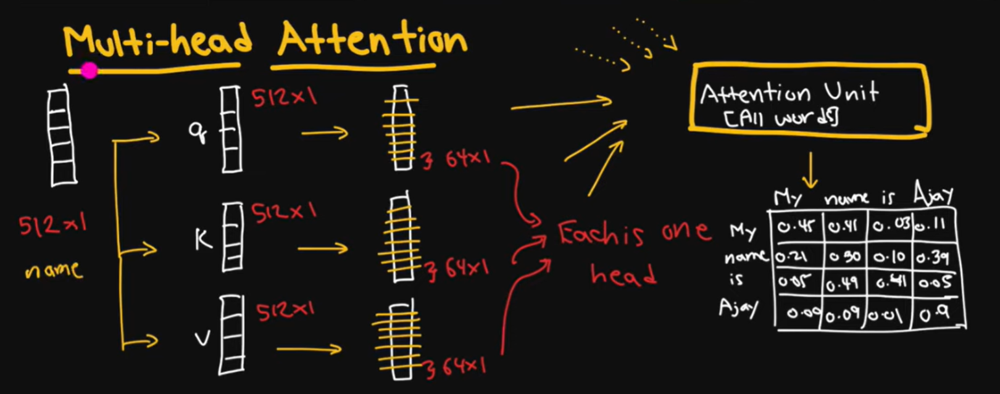

- Input:
    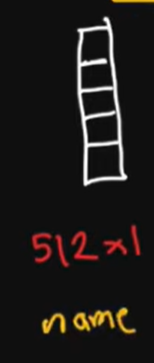
    - 512 x 1 vector for one of the input words (or byte-piece encodings), e.g one of My name is Richard
- Breakdown input vector into 3 x 512 x 1 vectors
    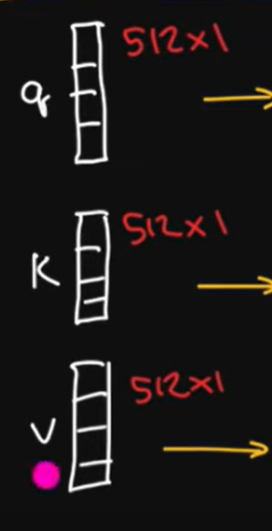
    - Query: What ami looking for? 
    - key: what can i offer?
    - value: what can i actually offer?
- These are broken down into 8 pieces of 64 x 1 each.. .. 
    - 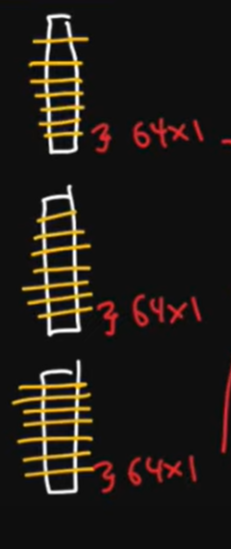
    - each of these 8 pieces are an attention head ! 
- Attention Unit [All words]:
    - 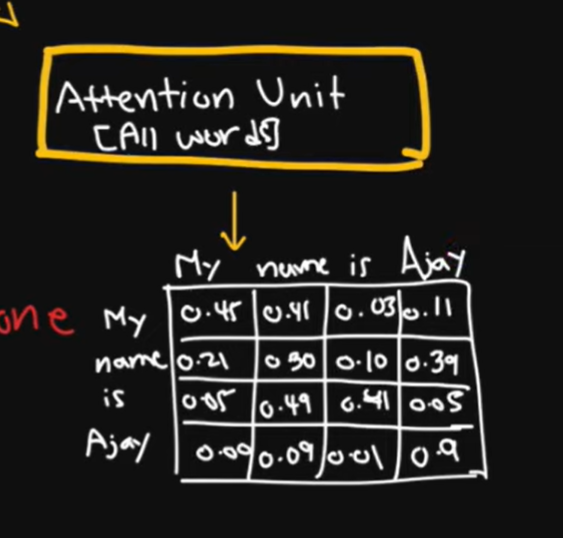
    - These 8 are passed to an attention unit:
        - we are going to generate for each head:
        - An attention matrix
            - Which is going to be a sequence by sequence length 
            - 4 x 4 
            - 4 words in "my name is richard"
            - Each row will add to 1. 
            - as it is a probabillity distribution
            - There will be 8 such attention matrices
                - As we have 8 attention heads in this multi head attention system
                - this will generate output vectors that are concatenated
                    - This output vector has: extremely good contextual awareness!! 
                    - GOAL OF THIS: Come up with a vector this is MORE CONTEXTUALLY AWARE



# Multi head attention

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

### Generate random data for this part :
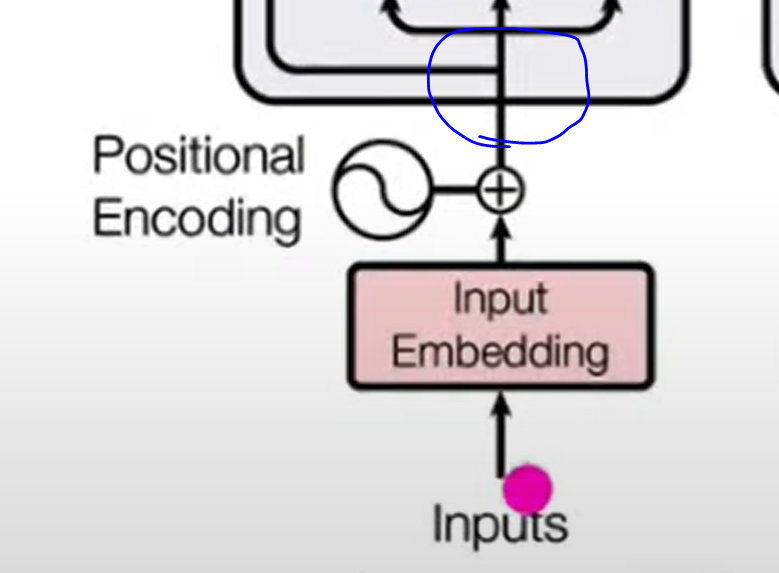

In [3]:
sequence_length = 4
batch_size = 1
input_dim = 512
d_model = 512
x = torch.randn( (batch_size, sequence_length, input_dim) ) # just before the multihead attention phase.. 

In [4]:
x.size()

torch.Size([1, 4, 512])

In [9]:
qkv_layer = nn.Linear(input_dim , 3 * d_model) ## Map the input (512) to 3 * model dimension
# create the query vector, kley vector and the value vector all concatenated -- ALL OF THEM HAVE 8 attention heads
# pass these all into the layer to generate the qkv layer.. 

In [8]:
qkv = qkv_layer(x)
qkv.shape # 1 batch, 4 words, each word is 1536 in size.. 

torch.Size([1, 4, 1536])

Text(0.5, 1.0, 'qkv distribution')

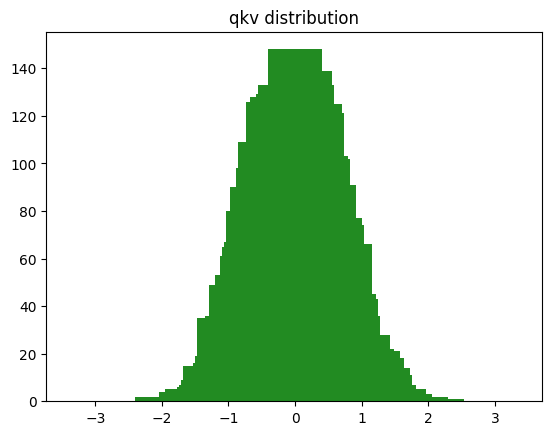

In [10]:
import matplotlib.pyplot as plt
y_val = torch.histc(qkv, bins=200, min=-3, max=3)
x_val = np.arange(-1, 1, 0.01) * 3
plt.bar(x_val, y_val, align='center', color=['forestgreen'])
plt.title('qkv distribution') # because its generate via normal dist, it looks as that

In [11]:
num_heads = 8
head_dim = d_model // num_heads
qkv = qkv.reshape(batch_size, sequence_length, num_heads, 3 * head_dim)

In [12]:
qkv.shape

torch.Size([1, 4, 8, 192])

In [13]:
qkv = qkv.permute(0, 2, 1, 3) # [batch_size, num_heads, sequence_length, 3*head_dim]
qkv.shape

torch.Size([1, 8, 4, 192])

In [14]:
q, k, v = qkv.chunk(3, dim=-1) # break down the input vector with 192 dims into 3 x 64 dims.. 
q.shape, k.shape, v.shape

(torch.Size([1, 8, 4, 64]),
 torch.Size([1, 8, 4, 64]),
 torch.Size([1, 8, 4, 64]))

## Self Attention for multiple heads

For a single head:
$$
\text{self attention} = softmax\bigg(\frac{Q.K^T}{\sqrt{d_k}}+M\bigg)
$$

$$
\text{new V} = \text{self attention}.V
$$ 


## Every Query vector of a word is compared to every OTHER word's Key vector!
- Represented by QK^T
- 

In [16]:
import math

In [17]:
d_k = q.size()[-1] 
scaled = torch.matmul(q, k.transpose(-2, -1)) / math.sqrt(d_k) # cant just go .T to transpose, need to specify the exact dimensions
## scaled by sqrt d_k so variance remains small.. 
scaled.shape

torch.Size([1, 8, 4, 4])

In [ ]:
k.T.shape

torch.Size([64, 4, 8, 1])

In [ ]:
y = torch.randn(2, 3)
torch.transpose(y, 0, 1)

tensor([[-0.4146,  1.1240],
        [-0.0925,  0.0419],
        [-1.1873,  0.4655]])

In [ ]:
torch.transpose(y, 1, 0)

tensor([[-0.4146,  1.1240],
        [-0.0925,  0.0419],
        [-1.1873,  0.4655]])

In [ ]:
k.transpose(-1, -2) == k.transpose(-2, -1)

tensor([[[[True, True, True, True],
          [True, True, True, True],
          [True, True, True, True],
          ...,
          [True, True, True, True],
          [True, True, True, True],
          [True, True, True, True]],

         [[True, True, True, True],
          [True, True, True, True],
          [True, True, True, True],
          ...,
          [True, True, True, True],
          [True, True, True, True],
          [True, True, True, True]],

         [[True, True, True, True],
          [True, True, True, True],
          [True, True, True, True],
          ...,
          [True, True, True, True],
          [True, True, True, True],
          [True, True, True, True]],

         ...,

         [[True, True, True, True],
          [True, True, True, True],
          [True, True, True, True],
          ...,
          [True, True, True, True],
          [True, True, True, True],
          [True, True, True, True]],

         [[True, True, True, True],
          [True, 

In [ ]:
k.transpose(-1, -2).shape

torch.Size([1, 8, 64, 4])

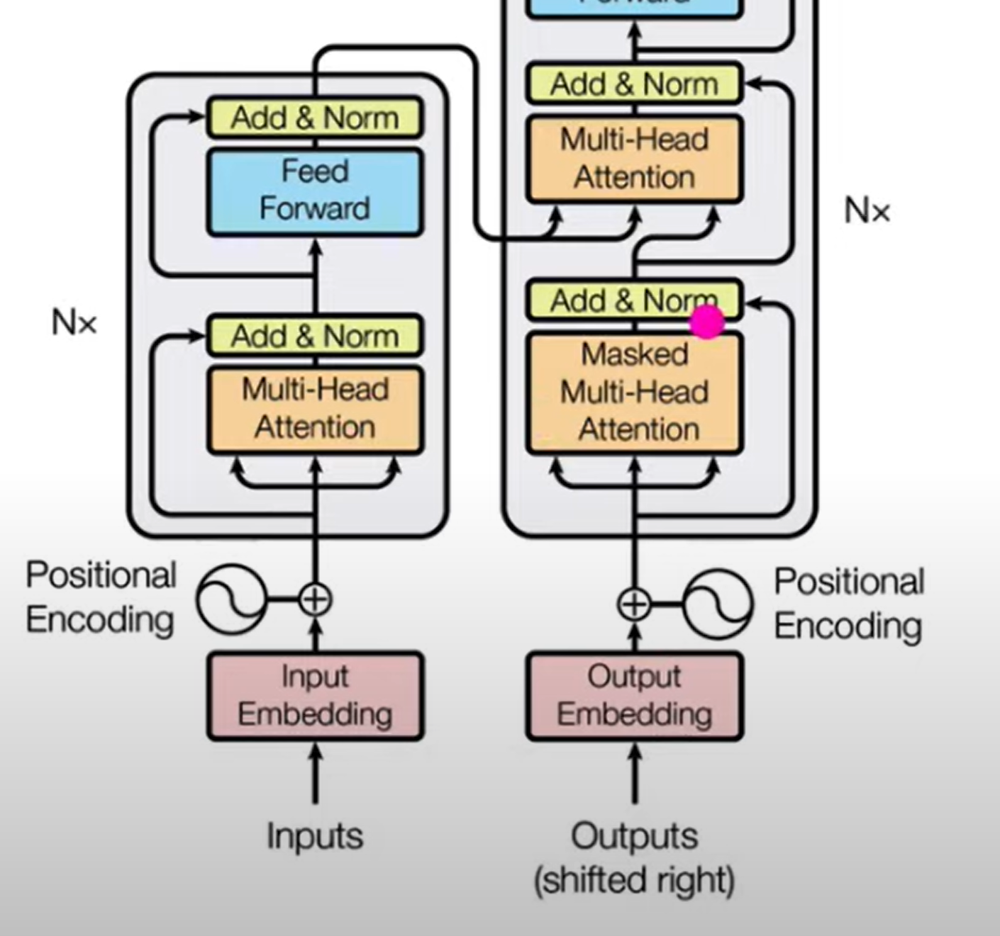

In [ ]:
mask = torch.full(scaled.size() , float('-inf')) # Fill with negative infinity values.. 
mask = torch.triu(mask, diagonal=1) # upper triangular mask - fill lower traingular with 0's
mask[0][1] # mask for input to a single head

tensor([[0., -inf, -inf, -inf],
        [0., 0., -inf, -inf],
        [0., 0., 0., -inf],
        [0., 0., 0., 0.]])

In [ ]:
(scaled + mask)[0][0] # one head. is a 4x4 matrix.. -inf becuase we are doing softmax operations. exp(-0 ) = 0 

tensor([[-0.0611,    -inf,    -inf,    -inf],
        [ 0.5596,  0.0404,    -inf,    -inf],
        [ 0.1348, -0.0516,  0.3945,    -inf],
        [ 0.0038,  0.5560, -0.2397,  0.4025]], grad_fn=<SelectBackward0>)

In [18]:
scaled += mask

NameError: name 'mask' is not defined

In [ ]:
np.exp(0.5596) / (np.exp(0.5596) + np.exp(0.0404))

0.6269606805367254

In [ ]:
attention = F.softmax(scaled, dim=-1)

In [ ]:
attention.shape

torch.Size([1, 8, 4, 4])

In [ ]:
attention[0][0]

tensor([[1.0000, 0.0000, 0.0000, 0.0000],
        [0.6270, 0.3730, 0.0000, 0.0000],
        [0.3198, 0.2655, 0.4147, 0.0000],
        [0.1996, 0.3467, 0.1564, 0.2973]], grad_fn=<SelectBackward0>)

In [ ]:
values = torch.matmul(attention, v) # new value vectors are MUCH MORE CONTEXT AWARE - has attention applied to it!!! 
values.shape

torch.Size([1, 8, 4, 64])

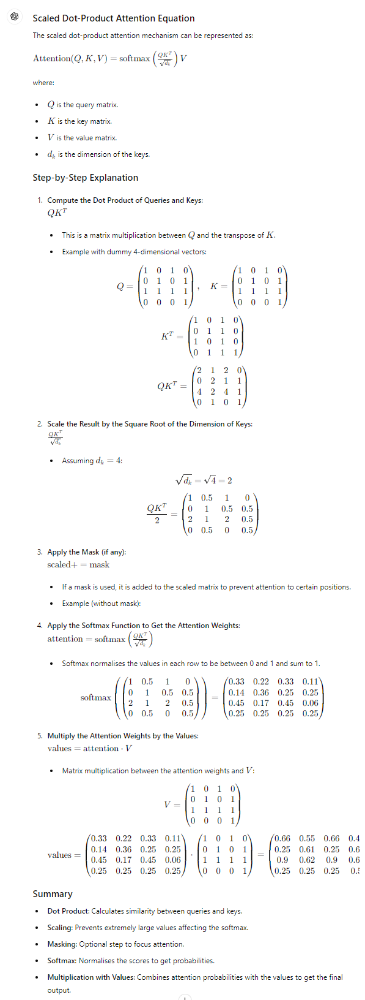

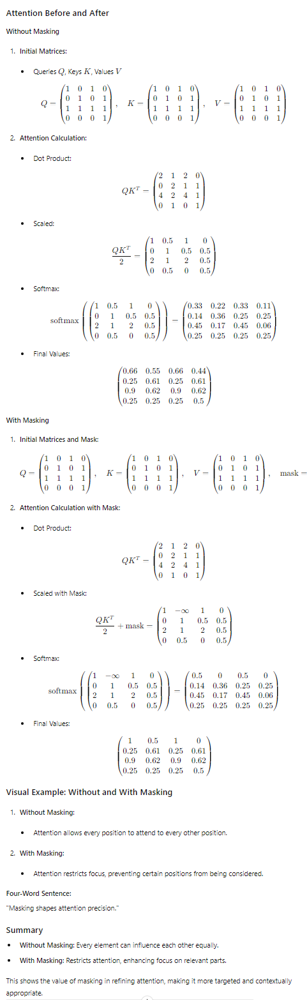


### Explanation of QKV in Attention Mechanisms

In attention mechanisms, the Query (Q), Key (K), and Value (V) matrices are central to how the model determines the relevance of different pieces of information and retrieves useful data based on that relevance.

#### Intuitive Explanation

- **Query (Q)**: Represents what we're looking for. For instance, in a sentence, the query helps specify the target or focus of our search.
- **Key (K)**: Acts like an index or reference point. Keys are used to compare with the query to determine how relevant or similar each piece of information is to the query.
- **Value (V)**: Contains the actual information or data that we want to retrieve. Values are weighted and combined based on their relevance scores to produce the final output.

### Example: "My name is Richard"

Let's break down how QKV works with this sentence:

1. **Query (Q)**:
   - Suppose we want to understand the significance of the word "Richard" in the sentence. The query vector is designed to represent this search intent.

2. **Key (K)**:
   - Each word in the sentence "My name is Richard" will have an associated key. These keys help determine how relevant each word is to the query.
   - Example keys for the words might be:
     - "My": [0.1, 0.2]
     - "name": [0.2, 0.3]
     - "is": [0.1, 0.4]
     - "Richard": [0.9, 0.7]

3. **Value (V)**:
   - Each word also has a value vector, which contains the information that will be retrieved if the word is considered relevant to the query.
   - Example values for the words might be:
     - "My": [0.1, 0.1]
     - "name": [0.3, 0.3]
     - "is": [0.4, 0.4]
     - "Richard": [0.9, 1.0]

### Relevance Scores

- The attention mechanism computes the relevance scores by comparing the query with each key. This is typically done using a dot product followed by scaling and a softmax function to normalize the scores.
- For example, if the query vector is [0.8, 0.7], the relevance score for each word might be calculated as follows:

   \[
   \text{Relevance}("My") = \text{softmax}([0.8, 0.7] \cdot [0.1, 0.2])
   \]

- After computing relevance scores for each word, these scores are used to weight the values, and the weighted values are summed to produce the final output.

### Backpropagation and Training

- **Which are trained?**
  - All three matrices (Q, K, V) are trained via backpropagation. The model learns to adjust these matrices to improve the accuracy of the attention mechanism.
  - During training, the model adjusts the query, key, and value matrices to better capture the relationships and importance of different words or tokens in the input data.

### Practical Example

Let's revisit our example sentence "My name is Richard" with a focus on understanding the role of each word in the context of the sentence:

1. **Query**: Represents our interest in the sentence, such as focusing on the word "Richard".

2. **Key**: Each word's key helps determine its relevance to the query:
   - "My": low relevance
   - "name": medium relevance
   - "is": medium relevance
   - "Richard": high relevance

3. **Value**: The actual information we retrieve is based on these relevance scores:
   - "Richard" would have the highest contribution to the final output because its value vector has the highest relevance score.

By adjusting Q, K, and V during training, the model learns to focus on the most relevant parts of the input to answer queries effectively. This process ensures that the retrieved values (final output) accurately reflect the importance and context of each word in the sentence.

In [ ]:
import math

def scaled_dot_product(q, k, v, mask=None): # mask deals with encoder or decoder.. 
    d_k = q.size()[-1]
    scaled = torch.matmul(q, k.transpose(-1, -2)) / math.sqrt(d_k)
    if mask is not None:
        scaled += mask
    attention = F.softmax(scaled, dim=-1)
    values = torch.matmul(attention, v)
    return values, attention

In [ ]:
values, attention = scaled_dot_product(q, k, v, mask=mask)

In [ ]:
attention.shape

torch.Size([1, 8, 4, 4])

In [ ]:
attention[0][0]

tensor([[1.0000, 0.0000, 0.0000, 0.0000],
        [0.6270, 0.3730, 0.0000, 0.0000],
        [0.3198, 0.2655, 0.4147, 0.0000],
        [0.1996, 0.3467, 0.1564, 0.2973]], grad_fn=<SelectBackward0>)

In [ ]:
values.size() 

torch.Size([1, 8, 4, 64])

In [ ]:
values = values.reshape(batch_size, sequence_length, num_heads * head_dim)
values.size()

torch.Size([1, 4, 512])

In [ ]:
linear_layer = nn.Linear(d_model, d_model)

In [ ]:
out = linear_layer(values)

In [ ]:
out.shape # more context aware !

torch.Size([1, 4, 512])

In [ ]:
out

tensor([[[ 0.0687,  0.0984,  0.0381,  ...,  0.1252,  0.0707, -0.0547],
         [-0.0399,  0.0419, -0.0933,  ...,  0.3064,  0.1585,  0.0599],
         [-0.0684, -0.0657,  0.2306,  ...,  0.0606,  0.0670,  0.0293],
         [ 0.0781, -0.0159, -0.0343,  ...,  0.0074, -0.1094, -0.0365]]],
       grad_fn=<ViewBackward0>)

## Class

In [1]:
import torch
import torch.nn as nn
import math
import torch.nn.functional as F

# Function to compute the scaled dot-product attention
def scaled_dot_product(q, k, v, mask=None):
    d_k = q.size()[-1]  # Get the dimension of the keys
    scaled = torch.matmul(q, k.transpose(-1, -2)) / math.sqrt(d_k)  # Compute the dot product and scale it
    if mask is not None:
        scaled += mask  # Apply mask if provided
    attention = F.softmax(scaled, dim=-1)  # Apply softmax to get attention weights
    values = torch.matmul(attention, v)  # Multiply attention weights with values to get the final output
    return values, attention

# MultiheadAttention class
class MultiheadAttention(nn.Module):

    def __init__(self, input_dim, d_model, num_heads):
        super().__init__()
        self.input_dim = input_dim  # Input dimension
        self.d_model = d_model  # Model dimension
        self.num_heads = num_heads  # Number of attention heads
        self.head_dim = d_model // num_heads  # Dimension per head
        self.qkv_layer = nn.Linear(input_dim, 3 * d_model)  # Linear layer to generate Q, K, and V
        self.linear_layer = nn.Linear(d_model, d_model)  # Final linear layer to combine the outputs

    def forward(self, x, mask=None):
        batch_size, sequence_length, input_dim = x.size()
        print(f"x.size(): {x.size()}")  # Print the size of the input tensor

        qkv = self.qkv_layer(x)  # Generate Q, K, and V by passing through the linear layer
        print(f"qkv.size(): {qkv.size()} - QKV tensor after linear transformation")

        qkv = qkv.reshape(batch_size, sequence_length, self.num_heads, 3 * self.head_dim)
        print(f"qkv.size(): {qkv.size()} - Reshape to separate heads")

        qkv = qkv.permute(0, 2, 1, 3)  # Permute to get [batch_size, num_heads, sequence_length, 3 * head_dim]
        print(f"qkv.size(): {qkv.size()} - Permute to bring num_heads forward")

        q, k, v = qkv.chunk(3, dim=-1)  # Split QKV into Q, K, and V
        print(f"q size: {q.size()}, k size: {k.size()}, v size: {v.size()} - Split into Q, K, and V")

        values, attention = scaled_dot_product(q, k, v, mask)  # Compute scaled dot-product attention
        print(f"values.size(): {values.size()}, attention.size: {attention.size()} - Values and attention after scaled dot-product")

        values = values.reshape(batch_size, sequence_length, self.num_heads * self.head_dim)
        print(f"values.size(): {values.size()} - Reshape to combine attention heads back")

        out = self.linear_layer(values)  # Final linear layer to combine the outputs
        print(f"out.size(): {out.size()} - Output after final linear transformation")
        return out

# Example usage
batch_size = 2
sequence_length = 4
input_dim = 8
d_model = 8
num_heads = 2

x = torch.rand(batch_size, sequence_length, input_dim)
multihead_attn = MultiheadAttention(input_dim, d_model, num_heads)
output = multihead_attn(x)


x.size(): torch.Size([2, 4, 8])
qkv.size(): torch.Size([2, 4, 24]) - QKV tensor after linear transformation
qkv.size(): torch.Size([2, 4, 2, 12]) - Reshape to separate heads
qkv.size(): torch.Size([2, 2, 4, 12]) - Permute to bring num_heads forward
q size: torch.Size([2, 2, 4, 4]), k size: torch.Size([2, 2, 4, 4]), v size: torch.Size([2, 2, 4, 4]) - Split into Q, K, and V
values.size(): torch.Size([2, 2, 4, 4]), attention.size: torch.Size([2, 2, 4, 4]) - Values and attention after scaled dot-product
values.size(): torch.Size([2, 4, 8]) - Reshape to combine attention heads back
out.size(): torch.Size([2, 4, 8]) - Output after final linear transformation


## Input

In [2]:
input_dim = 1024
d_model = 512
num_heads = 8

batch_size = 30
sequence_length = 5
x = torch.randn( (batch_size, sequence_length, input_dim) )

model = MultiheadAttention(input_dim, d_model, num_heads)
out = model.forward(x)

x.size(): torch.Size([30, 5, 1024])
qkv.size(): torch.Size([30, 5, 1536]) - QKV tensor after linear transformation
qkv.size(): torch.Size([30, 5, 8, 192]) - Reshape to separate heads
qkv.size(): torch.Size([30, 8, 5, 192]) - Permute to bring num_heads forward
q size: torch.Size([30, 8, 5, 64]), k size: torch.Size([30, 8, 5, 64]), v size: torch.Size([30, 8, 5, 64]) - Split into Q, K, and V
values.size(): torch.Size([30, 8, 5, 64]), attention.size: torch.Size([30, 8, 5, 5]) - Values and attention after scaled dot-product
values.size(): torch.Size([30, 5, 512]) - Reshape to combine attention heads back
out.size(): torch.Size([30, 5, 512]) - Output after final linear transformation


# Positional Encoding
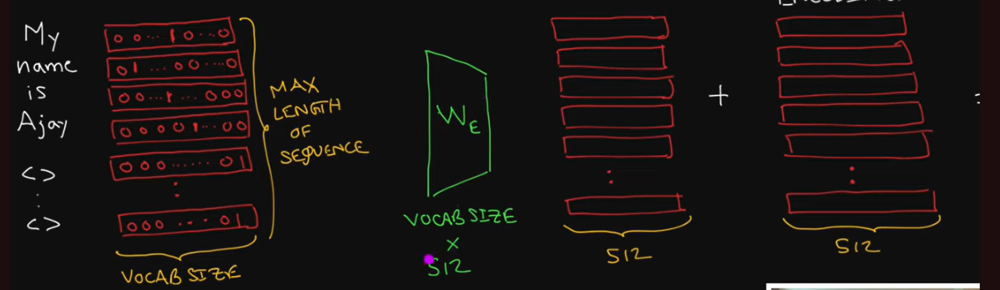
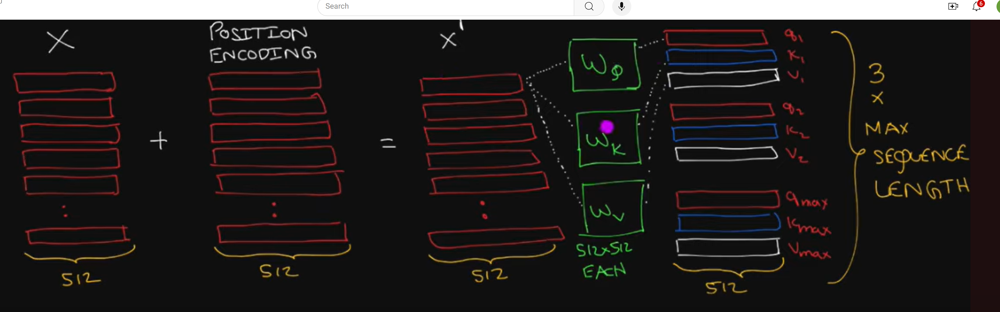


- 1. Input: "My Name Is Richard"
- 2. Embed: "One hot encode" where dim = vocab size
- 3. Pad: Add padding until max length of sequence.. 
- 4. Parameters to learn: Vocab size x 512.. 
- 5. Output of weights is 512 dim vecotr + add positional encoding of same size.
- 6. Position Encoded vector.. 512 dimensions to feed into weights of Q, k, v
- 7. Query Key and Value weights are all 512 x 512
    - Green transformations are learnable parameters!
    - 512x512x3 (each of query, key, value)
- 8. Output are embeddings/vectors for each of the qkv is 3 x max sequence length
- 


### Positional encoding deep dive.. 

### Intuitive Explanation of Positional Encoding in Transformers

Positional encoding is a crucial concept in transformer models, helping them understand the order of words in a sequence. Here, we break down the key elements and reasons behind positional encoding in an intuitive and clear manner.

#### Positional Encoding Equations

The positional encoding for a given position \( pos \) and dimension \( i \) is defined as:



1. $PE_{(pos, 2i)} = \sin\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$

2. $PE_{(pos, 2i+1)} = \cos\left(\frac{pos}{10000^{\frac{2i}{d_{model}}}}\right)$



Where:
- \( d_{model} \) is the embedding length (e.g., 512).
- \( pos \) is the position of the word in the sequence.
- \( i \) is the dimension index.

### Why Use Positional Encoding?

1. **Periodicity**:
   - **What it means**: Positional encoding introduces periodic functions (sine and cosine) that repeat over fixed intervals.
   - **Intuition**: By using these periodic functions, the model can recognize patterns and relative positions, even for long sequences, allowing it to understand the structure and context better.

2. **Constrained Values**:
   - **What it means**: The values of the positional encodings are constrained between -1 and 1.
   - **Intuition**: Constrained values ensure stability and prevent numerical issues during training. They help the model focus on learning meaningful relationships between positions without being overwhelmed by large numbers.

3. **Easy to Extrapolate for Long Sequences**:
   - **What it means**: Positional encodings allow the model to generalize to longer sequences than those seen during training.
   - **Intuition**: The mathematical functions used (sine and cosine) ensure that the positional information can be computed for any position, making it easy to handle sequences of varying lengths without needing to retrain or adjust the model significantly.

### Visual and Intuitive Breakdown

1. **Periodic Nature**:
   - Imagine a wave-like pattern that repeats itself. This repetition helps the model recognize sequences and patterns no matter where they appear.
   - For instance, a sine wave repeats every \( 2\pi \). By encoding positions this way, the model can detect cycles and structures in the data.

2. **Constrained Values**:
   - Picture a pendulum swinging back and forth, never going beyond its fixed range. This constraint ensures that the positional encodings remain within a predictable and stable range.
   - This helps in maintaining the model's focus on learning the positional relationships without getting distracted by out-of-bound values.

3. **Generalization for Long Sequences**:
   - Think of a conveyor belt that can be extended infinitely. Positional encodings allow the transformer model to handle sequences of any length, just like a conveyor belt that can be extended to transport items over long distances.
   - This flexibility is crucial for processing natural language, where sentences can vary greatly in length.

### Key Takeaways

- **Periodicity** helps the model recognize and utilize repeating patterns.
- **Constrained Values** ensure stability and focus during learning.
- **Generalization** allows the model to handle sequences of varying lengths efficiently.

By using these intuitive analogies and focusing on the core reasons behind positional encoding, we can appreciate how it empowers transformer models to understand and process natural language effectively.

## Positional Encoding

This notebook will code positional encoding for Transformer neural networks with pytrch

In [3]:
import torch
import torch.nn as nn

max_sequence_length = 10
d_model = 6 #typically 512

$$
PE(\text{position}, 2i) = \sin\bigg( \frac{ \text{position} }{10000^\frac{2i}{d_{model}}} \bigg)
$$

$$
PE(\text{position}, 2i+1) = \cos\bigg( \frac{ \text{position} }{10000^\frac{2i}{d_{model}}} \bigg)
$$

We can rewrite these as

$$
PE(\text{position}, i) = \sin\bigg( \frac{ \text{position} }{10000^\frac{i}{d_{model}}} \bigg) \text{ when i is even}
$$

$$
PE(\text{position}, i) = \cos\bigg( \frac{ \text{position} }{10000^\frac{i-1}{d_{model}}} \bigg) \text{ when i is odd}
$$

In [4]:
even_i = torch.arange(0, d_model, 2).float()
even_i

tensor([0., 2., 4.])

In [5]:
even_denominator = torch.pow(10000, even_i/d_model)
even_denominator

tensor([  1.0000,  21.5443, 464.1590])

In [6]:
odd_i = torch.arange(1, d_model, 2).float()
odd_i

tensor([1., 3., 5.])

In [7]:
even_denominator = torch.pow(10000, (odd_i - 1)/d_model)
even_denominator

tensor([  1.0000,  21.5443, 464.1590])

`even_denominator` and `odd_denominator` are the same! So we can just do one of these actions and call the resulting variable `denominator`

In [8]:
denominator = even_denominator

In [9]:
position = torch.arange(max_sequence_length, dtype=torch.float).reshape(max_sequence_length, 1)

In [10]:
position

tensor([[0.],
        [1.],
        [2.],
        [3.],
        [4.],
        [5.],
        [6.],
        [7.],
        [8.],
        [9.]])

In [11]:
even_PE = torch.sin(position / denominator)
odd_PE = torch.cos(position / denominator)

In [12]:
even_PE

tensor([[ 0.0000,  0.0000,  0.0000],
        [ 0.8415,  0.0464,  0.0022],
        [ 0.9093,  0.0927,  0.0043],
        [ 0.1411,  0.1388,  0.0065],
        [-0.7568,  0.1846,  0.0086],
        [-0.9589,  0.2300,  0.0108],
        [-0.2794,  0.2749,  0.0129],
        [ 0.6570,  0.3192,  0.0151],
        [ 0.9894,  0.3629,  0.0172],
        [ 0.4121,  0.4057,  0.0194]])

In [13]:
even_PE.shape

torch.Size([10, 3])

In [14]:
odd_PE

tensor([[ 1.0000,  1.0000,  1.0000],
        [ 0.5403,  0.9989,  1.0000],
        [-0.4161,  0.9957,  1.0000],
        [-0.9900,  0.9903,  1.0000],
        [-0.6536,  0.9828,  1.0000],
        [ 0.2837,  0.9732,  0.9999],
        [ 0.9602,  0.9615,  0.9999],
        [ 0.7539,  0.9477,  0.9999],
        [-0.1455,  0.9318,  0.9999],
        [-0.9111,  0.9140,  0.9998]])

In [15]:
odd_PE.shape

torch.Size([10, 3])

In [16]:
stacked = torch.stack([even_PE, odd_PE], dim=2)
stacked.shape

torch.Size([10, 3, 2])

In [17]:
PE = torch.flatten(stacked, start_dim=1, end_dim=2)
PE

tensor([[ 0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [ 0.8415,  0.5403,  0.0464,  0.9989,  0.0022,  1.0000],
        [ 0.9093, -0.4161,  0.0927,  0.9957,  0.0043,  1.0000],
        [ 0.1411, -0.9900,  0.1388,  0.9903,  0.0065,  1.0000],
        [-0.7568, -0.6536,  0.1846,  0.9828,  0.0086,  1.0000],
        [-0.9589,  0.2837,  0.2300,  0.9732,  0.0108,  0.9999],
        [-0.2794,  0.9602,  0.2749,  0.9615,  0.0129,  0.9999],
        [ 0.6570,  0.7539,  0.3192,  0.9477,  0.0151,  0.9999],
        [ 0.9894, -0.1455,  0.3629,  0.9318,  0.0172,  0.9999],
        [ 0.4121, -0.9111,  0.4057,  0.9140,  0.0194,  0.9998]])

## Class

Let's combine all the code above into a cute class

In [18]:
import torch
import torch.nn as nn

class PositionalEncoding(nn.Module):

    def __init__(self, d_model, max_sequence_length):
        super().__init__()
        self.max_sequence_length = max_sequence_length
        self.d_model = d_model

    def forward(self):
        even_i = torch.arange(0, self.d_model, 2).float()
        denominator = torch.pow(10000, even_i/self.d_model)
        position = torch.arange(self.max_sequence_length).reshape(self.max_sequence_length, 1)
        even_PE = torch.sin(position / denominator)
        odd_PE = torch.cos(position / denominator)
        stacked = torch.stack([even_PE, odd_PE], dim=2)
        PE = torch.flatten(stacked, start_dim=1, end_dim=2)
        return PE

In [19]:
pe = PositionalEncoding(d_model=6, max_sequence_length=10)
pe.forward()

tensor([[ 0.0000,  1.0000,  0.0000,  1.0000,  0.0000,  1.0000],
        [ 0.8415,  0.5403,  0.0464,  0.9989,  0.0022,  1.0000],
        [ 0.9093, -0.4161,  0.0927,  0.9957,  0.0043,  1.0000],
        [ 0.1411, -0.9900,  0.1388,  0.9903,  0.0065,  1.0000],
        [-0.7568, -0.6536,  0.1846,  0.9828,  0.0086,  1.0000],
        [-0.9589,  0.2837,  0.2300,  0.9732,  0.0108,  0.9999],
        [-0.2794,  0.9602,  0.2749,  0.9615,  0.0129,  0.9999],
        [ 0.6570,  0.7539,  0.3192,  0.9477,  0.0151,  0.9999],
        [ 0.9894, -0.1455,  0.3629,  0.9318,  0.0172,  0.9999],
        [ 0.4121, -0.9111,  0.4057,  0.9140,  0.0194,  0.9998]])

Happy Coding!

# Layer Normalisation
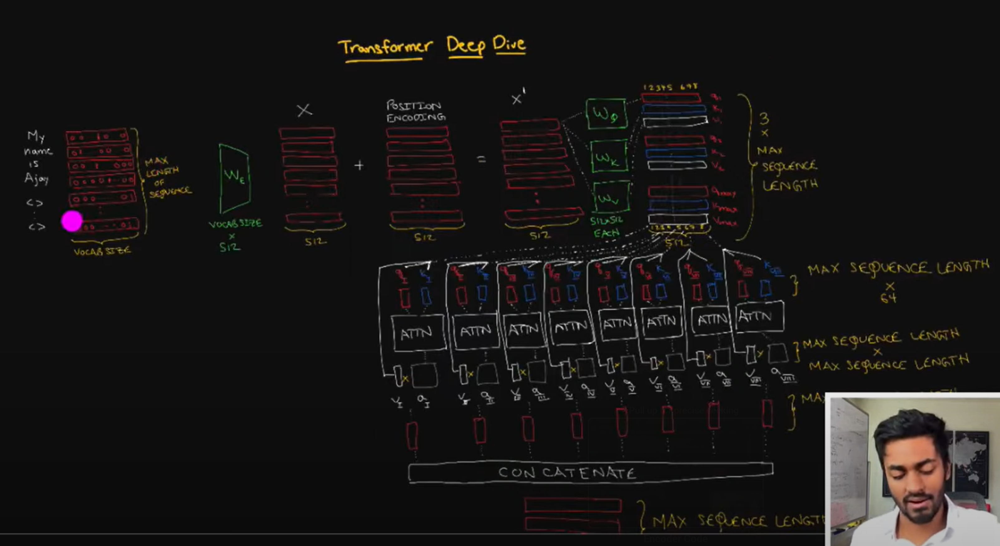

- After the QKV weight outputs
    - we have 3 x MAX SEQUENCE LENGTH of vectors per word
    - NOw, we split the QKV into 8 parts.. 
        - Each part is a vector for 1 head
- each 8 heads are passed into 8 attention blocks


- each attention block:
    - multiply query and key vectors
    - apply some scaling as well as masking
    - after passing it into attention block:    
        - Get attention matrices
        - Sequence length x sequence length
        - num of words x num of words
            - This lets us see how much a word should pay to each other
    - Times that by the value matrix
        - which is sequence length x 64
- When you multiply these together
    - 8 individual vectors 
        - max seq length x 64 for each of the 8

- Concatenate them
    - since theres 8
        - Max seq x 64 x 8 (512)


- this is the output right before the normalisation step:


SyntaxError: unexpected character after line continuation character (3834224350.py, line 2)



- add & norm takes in th eoutput of the mult-head attention block 
- as well as a residual connection. 
    - why? Because during back propogation, there are vanishing gradients
        - Gradients become 0 and model stops learning
    - This will mean we need to feed in the raw embeddings 
        - induce stronger signal from input into differnet parts of the network.
- 

## Updated Equation
$$ \text{LayerNorm} \left[ x' + \text{out} \right] $$

## Notes on Layer Normalisation in a Transformer

- **Purpose**: Layer Normalisation (LayerNorm) stabilises the learning process and improves the convergence of the model by normalising the inputs to a layer.
  
- **Position in Transformer**:
  - Applied after the residual connection which adds the input \( x' \) to the output of the sub-layer (denoted as \(\text{out}\)).
  - Helps in maintaining the signal flow through the network without degradation.

- **Functionality**:
  - Computes the mean and variance for each feature (across the batch) of the input \( x' + \text{out} \).
  - Normalises the input using these statistics.
  - Applies learnable scale and shift parameters \(\gamma\) and \(\beta\).

- **Equation**:
  $$ \text{LayerNorm}(x) = \gamma \cdot \frac{x - \mu}{\sigma + \epsilon} + \beta $$
  - \(\mu\): Mean of the input.
  - \(\sigma\): Standard deviation of the input.
  - \(\epsilon\): Small constant to prevent division by zero.
  - \(\gamma\): Learnable scale parameter.
  - \(\beta\): Learnable shift parameter.

- **Key Points**:
  - **Stabilises Training**: Prevents large updates in gradients, leading to a more stable training process.
  - **Improves Performance**: Often results in faster convergence and better model performance.
  - **Residual Connection**: The addition \( x' + \text{out} \) is a residual connection that helps in training very deep networks by providing shortcut paths.

- **Application in Transformer Architecture**:
  - Used in both the encoder and decoder blocks.
  - Typically placed before and after the attention and feedforward sub-layers.

- **Identification of \( x' \)**:
  - \( x' \) is the output of the positional encoding step.
  - Positional encoding adds information about the position of the tokens in the sequence to the input embeddings, enabling the model to capture the order of the sequence.

- **Learnable Parameters**:
  - **\(\gamma\) and \(\beta\)**:
    - These parameters allow the model to adapt the normalised output for each feature.
    - \(\gamma\) scales the normalised output, while \(\beta\) shifts it.
    - These parameters are learned during training to optimise the model's performance.

By ensuring that each layer's inputs are normalized, LayerNorm helps maintain the distribution of inputs across the network layers, which is crucial for the training of deep models like transformers. The inclusion of learnable parameters \(\gamma\) and \(\beta\) allows the model to flexibly adapt the normalised outputs, enhancing its capacity to learn complex patterns.

In [21]:
import torch
from torch import nn

In [22]:
inputs = torch.Tensor([[[0.2, 0.1, 0.3], [0.5, 0.1, 0.1]]])
B, S, E = inputs.size()
inputs = inputs.reshape(S, B, E)
inputs.size()

torch.Size([2, 1, 3])

In [23]:
parameter_shape = inputs.size()[-2:]
gamma = nn.Parameter(torch.ones(parameter_shape))
beta =  nn.Parameter(torch.zeros(parameter_shape))

In [24]:
gamma.size(), beta.size()

(torch.Size([1, 3]), torch.Size([1, 3]))

In [25]:
dims = [-(i + 1) for i in range(len(parameter_shape))]

In [26]:
dims

[-1, -2]

In [27]:
mean = inputs.mean(dim=dims, keepdim=True)
mean.size()

torch.Size([2, 1, 1])

In [28]:
mean

tensor([[[0.2000]],

        [[0.2333]]])

In [29]:
var = ((inputs - mean) ** 2).mean(dim=dims, keepdim=True)
epsilon = 1e-5
std = (var + epsilon).sqrt()
std

tensor([[[0.0817]],

        [[0.1886]]])

In [30]:
y = (inputs - mean) / std
y

tensor([[[ 0.0000, -1.2238,  1.2238]],

        [[ 1.4140, -0.7070, -0.7070]]])

In [31]:
out = gamma * y + beta

In [32]:
out

tensor([[[ 0.0000, -1.2238,  1.2238]],

        [[ 1.4140, -0.7070, -0.7070]]], grad_fn=<AddBackward0>)

## Class

In [33]:
import torch
from torch import nn

class LayerNormalization():
    def __init__(self, parameters_shape, eps=1e-5):
        self.parameters_shape = parameters_shape  # Shape of the parameters to be normalized
        self.eps = eps  # Small constant to prevent division by zero
        self.gamma = nn.Parameter(torch.ones(parameters_shape))  # Learnable scale parameter (γ)
        self.beta = nn.Parameter(torch.zeros(parameters_shape))  # Learnable shift parameter (β)

    def forward(self, input):
        # Calculate the dimensions along which to compute the mean and variance
        dims = [-(i + 1) for i in range(len(self.parameters_shape))]
        
        # Compute the mean across the specified dimensions
        mean = inputs.mean(dim=dims, keepdim=True)
        print(f"Mean \n ({mean.size()}): \n {mean}")
        
        # Compute the variance across the specified dimensions
        var = ((inputs - mean) ** 2).mean(dim=dims, keepdim=True)
        
        # Compute the standard deviation with added epsilon for numerical stability
        std = (var + self.eps).sqrt()
        print(f"Standard Deviation \n ({std.size()}): \n {std}")
        
        # Normalize the input (x - μ) / (σ + ε)
        y = (inputs - mean) / std
        print(f"y \n ({y.size()}) = \n {y}")
        
        # Scale and shift the normalized output (γ * y + β)
        out = self.gamma * y + self.beta
        print(f"out \n ({out.size()}) = \n {out}")
        
        return out


In [34]:
batch_size = 3
sentence_length = 5
embedding_dim = 8 
inputs = torch.randn(sentence_length, batch_size, embedding_dim)

print(f"input \n ({inputs.size()}) = \n {inputs}")

input 
 (torch.Size([5, 3, 8])) = 
 tensor([[[ 1.1024,  1.1417, -0.6873, -0.5522,  0.9084, -0.0928,  0.6913,
          -1.6991],
         [ 0.7570, -0.4890, -1.7793,  1.1269, -0.2366,  1.6399,  0.6107,
           0.1592],
         [-0.5618,  0.8642,  0.7481,  0.6619,  0.3055, -2.1031,  0.4957,
           1.7963]],

        [[-0.8122,  0.4174,  1.2952,  0.3486,  0.9950,  0.4873, -0.0221,
          -0.5977],
         [ 0.8669, -0.2554,  0.1281, -1.2728, -0.8838,  0.5594, -1.4943,
           0.1475],
         [ 1.1329, -1.2752, -0.8505,  0.2156,  0.0028, -0.2981,  1.9055,
           0.9701]],

        [[-1.9657, -0.8286,  0.4099, -0.3211,  0.3132,  2.2962, -0.8464,
           1.2158],
         [ 0.5402,  0.2387,  0.8636, -0.6159,  0.3993, -0.2553,  1.2993,
          -0.5531],
         [ 0.6636,  0.0231,  0.9067,  0.8052,  0.7987, -1.2310, -0.5277,
           1.5538]],

        [[ 0.4939, -0.4589,  0.4387,  1.1447, -2.2507,  0.0566, -1.7451,
          -1.4104],
         [-0.5413,  0.0087, 

In [35]:
layer_norm = LayerNormalization(inputs.size()[-1:])

In [36]:
out = layer_norm.forward(inputs)

Mean 
 (torch.Size([5, 3, 1])): 
 tensor([[[ 0.1015],
         [ 0.2236],
         [ 0.2758]],

        [[ 0.2639],
         [-0.2756],
         [ 0.2254]],

        [[ 0.0342],
         [ 0.2396],
         [ 0.3741]],

        [[-0.4664],
         [-0.3526],
         [ 0.0307]],

        [[ 0.0989],
         [ 0.4024],
         [ 0.3622]]])
Standard Deviation 
 (torch.Size([5, 3, 1])): 
 tensor([[[0.9626],
         [0.9995],
         [1.0863]],

        [[0.6765],
         [0.8058],
         [0.9959]],

        [[1.2439],
         [0.6357],
         [0.8395]],

        [[1.1358],
         [0.4843],
         [1.1705]],

        [[1.1834],
         [1.0869],
         [0.8442]]])
y 
 (torch.Size([5, 3, 8])) = 
 tensor([[[ 1.0398e+00,  1.0806e+00, -8.1955e-01, -6.7919e-01,  8.3826e-01,
          -2.0195e-01,  6.1264e-01, -1.8706e+00],
         [ 5.3363e-01, -7.1292e-01, -2.0040e+00,  9.0379e-01, -4.6047e-01,
           1.4170e+00,  3.8733e-01, -6.4461e-02],
         [-7.7112e-01,  5.4162e

In [37]:
out[0].mean(), out[0].std()

(tensor(0., grad_fn=<MeanBackward0>), tensor(1.0215, grad_fn=<StdBackward0>))